In [1]:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Importing Data

In [2]:
           data = pd.read_csv("Data/Life Expectancy Data.csv")
countrydex_data = pd.read_csv("Data/Life Expectancy Data.csv", index_col = 0)

pd.set_option("max_columns", None)
pd.set_option("max_rows", None)

# Exploration

In [3]:
#data.head(2938)
data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [5]:
pd.options.display.float_format = '{:.2f}'.format

data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.00,2007.52,4.61,2000.00,2004.00,2008.00,2012.00,2015.00
Life expectancy,2928.00,69.22,9.52,36.30,63.10,72.10,75.70,89.00
Adult Mortality,2928.00,164.80,124.29,1.00,74.00,144.00,228.00,723.00
infant deaths,2938.00,30.30,117.93,0.00,0.00,3.00,22.00,1800.00
Alcohol,2744.00,4.60,4.05,0.01,0.88,3.75,7.70,17.87
percentage expenditure,2938.00,738.25,1987.91,0.00,4.69,64.91,441.53,19479.91
Hepatitis B,2385.00,80.94,25.07,1.00,77.00,92.00,97.00,99.00
Measles,2938.00,2419.59,11467.27,0.00,0.00,17.00,360.25,212183.00
BMI,2904.00,38.32,20.04,1.00,19.30,43.50,56.20,87.30
under-five deaths,2938.00,42.04,160.45,0.00,0.00,4.00,28.00,2500.00


Renaming columns for easy access

In [6]:
data.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [7]:
data.rename(columns = {'Country':'country',
                       'Year':'year',
                       'Status':'status',
                       'Life expectancy ':'life_expectancy', 
                       'Adult Mortality':'adult_mortality', 
                       'infant deaths':'infant_deaths',
                       'Alcohol':'alchohol',
                       'percentage expenditure':'percentage_expenditure',
                       'Hepatitis B':'hepatitis_b',
                       'Measles ':'measles',
                       ' BMI ':'bmi',
                       'under-five deaths ':'under-five deaths',
                       'Polio':'polio',
                       'Total expenditure':'total_expenditure',
                       'Diphtheria ':'diphtheria',
                       ' HIV/AIDS':'hiv/aids',
                       'GDP':'gdp',
                       'Population':'population',
                       ' thinness  1-19 years':'thinness_1_19_years',
                       ' thinness 5-9 years':'thinness_5_9_years',
                       'Income composition of resources':'income_composition_of_resources',
                       'Schooling':'schooling'
                       }, inplace = True)
countrydex_data.rename(columns = {
                       'Year':'year',
                       'Status':'status',
                       'Life expectancy ':'life_expectancy', 
                       'Adult Mortality':'adult_mortality', 
                       'infant deaths':'infant_deaths',
                       'Alcohol':'alchohol',
                       'percentage expenditure':'percentage_expenditure',
                       'Hepatitis B':'hepatitis_b',
                       'Measles ':'measles',
                       ' BMI ':'bmi',
                       'under-five deaths ':'under-five deaths',
                       'Polio':'polio',
                       'Total expenditure':'total_expenditure',
                       'Diphtheria ':'diphtheria',
                       ' HIV/AIDS':'hiv/aids',
                       'GDP':'gdp',
                       'Population':'population',
                       ' thinness  1-19 years':'thinness_1_19_years',
                       ' thinness 5-9 years':'thinness_5_9_years',
                       'Income composition of resources':'income_composition_of_resources',
                       'Schooling':'schooling'
                       }, inplace = True)

# Cleaning

In [8]:
data.duplicated().sum()

0

Nice, no duplicates

In [9]:
def find_missing_percent(data):
    
    miss_df = pd.DataFrame({'ColumnName':[],'TotalMissingVals':[],'PercentMissing':[]})
    for col in data.columns:
        sum_miss_val = data[col].isnull().sum()
        percent_miss_val = round((sum_miss_val/data.shape[0])*100,2)
        miss_df = miss_df.append(dict(zip(miss_df.columns,[col,sum_miss_val,percent_miss_val])),ignore_index=True)
    return miss_df

miss_data = find_missing_percent(data)
print(f"Number of columns with missing values: {str(miss_data[miss_data['PercentMissing']>0.0].shape[0])}")

display(miss_data)

Number of columns with missing values: 14


,ColumnName,TotalMissingVals,PercentMissing
0,country,0.00,0.00
1,year,0.00,0.00
2,status,0.00,0.00
3,life_expectancy,10.00,0.34
4,adult_mortality,10.00,0.34
5,infant_deaths,0.00,0.00
6,alchohol,194.00,6.60
7,percentage_expenditure,0.00,0.00
8,hepatitis_b,553.00,18.82
9,measles,0.00,0.00


Let us analyse them one by one

**Life Expectancy and Adult Mortality**

In [10]:
#Uncomment for full access

data[data['life_expectancy'].isnull()]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
624,Cook Islands,2013,Developing,nan,nan,0,0.01,0.00,98.00,0,82.80,0,98.00,3.58,98.00,0.10,nan,nan,0.10,0.10,nan,nan
769,Dominica,2013,Developing,nan,nan,0,0.01,11.42,96.00,0,58.40,0,96.00,5.58,96.00,0.10,722.76,nan,2.70,2.60,0.72,12.70
1650,Marshall Islands,2013,Developing,nan,nan,0,0.01,871.88,8.00,0,81.60,0,79.00,17.24,79.00,0.10,3617.75,nan,0.10,0.10,nan,0.00
1715,Monaco,2013,Developing,nan,nan,0,0.01,0.00,99.00,0,nan,0,99.00,4.30,99.00,0.10,nan,nan,nan,nan,nan,nan
1812,Nauru,2013,Developing,nan,nan,0,0.01,15.61,87.00,0,87.30,0,87.00,4.65,87.00,0.10,136.18,nan,0.10,0.10,nan,9.60
1909,Niue,2013,Developing,nan,nan,0,0.01,0.00,99.00,0,77.30,0,99.00,7.20,99.00,0.10,nan,nan,0.10,0.10,nan,nan
1958,Palau,2013,Developing,nan,nan,0,nan,344.69,99.00,0,83.30,0,99.00,9.27,99.00,0.10,1932.12,292.00,0.10,0.10,0.78,14.20
2167,Saint Kitts and Nevis,2013,Developing,nan,nan,0,8.54,0.00,97.00,0,5.20,0,96.00,6.14,96.00,0.10,nan,nan,3.70,3.60,0.75,13.40
2216,San Marino,2013,Developing,nan,nan,0,0.01,0.00,69.00,0,nan,0,69.00,6.50,69.00,0.10,nan,nan,nan,nan,nan,15.10
2713,Tuvalu,2013,Developing,nan,nan,0,0.01,78.28,9.00,0,79.30,0,9.00,16.61,9.00,0.10,3542.14,1819.00,0.20,0.10,nan,0.00


In [11]:
#Uncomment for full access

countrydex_data['life_expectancy'].isnull()

Country
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False
Afghanistan                                             False


Upon observation we find that the country with missing life_expectancy, have data for only 1 year<br>

So the most appropriate thing to do is impute it with mean of Developing Country, as these are developing countries located in Oceania (Unforunately don't have Continent column)

However, these countries have a lot of othe missing data, and in future Imputation wont work on them(These 10 columns were a nuisance)

Hence I decided to drop them

We also deal with Adult Mortality, as countries missing data for Life Expectancy also miss data for Adult Mortality

In [12]:
#developing_life_expectancy_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).life_expectancy
#developing_adult_mortality_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).adult_mortality

#data['life_expectancy']= data['life_expectancy'].fillna(developing_life_expectancy_mean)
#data['adult_mortality']= data['adult_mortality'].fillna(developing_adult_mortality_mean)

data.drop(data[data['life_expectancy'].isnull()].index, inplace = True)

**Alchohol**

In [13]:
#Uncomment for full access

data[data['alchohol'].isnull()]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
32,Algeria,2015,Developing,75.60,19.00,21,nan,0.00,95.00,63,59.50,24,95.00,nan,95.00,0.10,4132.76,39871528.00,6.00,5.80,0.74,14.40
48,Angola,2015,Developing,52.40,335.00,66,nan,0.00,64.00,118,23.30,98,7.00,nan,64.00,1.90,3695.79,2785935.00,8.30,8.20,0.53,11.40
64,Antigua and Barbuda,2015,Developing,76.40,13.00,0,nan,0.00,99.00,0,47.70,0,86.00,nan,99.00,0.20,13566.95,nan,3.30,3.30,0.78,13.90
80,Argentina,2015,Developing,76.30,116.00,8,nan,0.00,94.00,0,62.80,9,93.00,nan,94.00,0.10,13467.12,43417765.00,1.00,0.90,0.83,17.30
96,Armenia,2015,Developing,74.80,118.00,1,nan,0.00,94.00,33,54.90,1,96.00,nan,94.00,0.10,369.65,291695.00,2.10,2.20,0.74,12.70
112,Australia,2015,Developed,82.80,59.00,1,nan,0.00,93.00,74,66.60,1,93.00,nan,93.00,0.10,56554.39,23789338.00,0.60,0.60,0.94,20.40
128,Austria,2015,Developed,81.50,65.00,0,nan,0.00,93.00,309,57.60,0,93.00,nan,93.00,0.10,43665.95,8633169.00,1.90,2.10,0.89,15.90
144,Azerbaijan,2015,Developing,72.70,118.00,5,nan,0.00,96.00,0,52.50,6,98.00,nan,96.00,0.10,55.31,9649341.00,2.80,2.90,0.76,12.70
160,Bahamas,2015,Developing,76.10,147.00,0,nan,0.00,95.00,0,64.50,0,95.00,nan,95.00,0.10,nan,nan,2.50,2.50,0.79,12.60
176,Bahrain,2015,Developing,76.90,69.00,0,nan,0.00,98.00,0,63.60,0,98.00,nan,98.00,0.10,22688.88,nan,6.20,6.10,0.82,14.50


South Sudan is a new country with a 'lot' of missing data

It would be safe to drop rows of South Sudan

In [14]:
data.drop(data[data['country']=='South Sudan'].index, inplace = True)

In [15]:
#Uncomment set_option for full access

data[data['alchohol'].isnull()]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
32,Algeria,2015,Developing,75.60,19.00,21,nan,0.00,95.00,63,59.50,24,95.00,nan,95.00,0.10,4132.76,39871528.00,6.00,5.80,0.74,14.40
48,Angola,2015,Developing,52.40,335.00,66,nan,0.00,64.00,118,23.30,98,7.00,nan,64.00,1.90,3695.79,2785935.00,8.30,8.20,0.53,11.40
64,Antigua and Barbuda,2015,Developing,76.40,13.00,0,nan,0.00,99.00,0,47.70,0,86.00,nan,99.00,0.20,13566.95,nan,3.30,3.30,0.78,13.90
80,Argentina,2015,Developing,76.30,116.00,8,nan,0.00,94.00,0,62.80,9,93.00,nan,94.00,0.10,13467.12,43417765.00,1.00,0.90,0.83,17.30
96,Armenia,2015,Developing,74.80,118.00,1,nan,0.00,94.00,33,54.90,1,96.00,nan,94.00,0.10,369.65,291695.00,2.10,2.20,0.74,12.70
112,Australia,2015,Developed,82.80,59.00,1,nan,0.00,93.00,74,66.60,1,93.00,nan,93.00,0.10,56554.39,23789338.00,0.60,0.60,0.94,20.40
128,Austria,2015,Developed,81.50,65.00,0,nan,0.00,93.00,309,57.60,0,93.00,nan,93.00,0.10,43665.95,8633169.00,1.90,2.10,0.89,15.90
144,Azerbaijan,2015,Developing,72.70,118.00,5,nan,0.00,96.00,0,52.50,6,98.00,nan,96.00,0.10,55.31,9649341.00,2.80,2.90,0.76,12.70
160,Bahamas,2015,Developing,76.10,147.00,0,nan,0.00,95.00,0,64.50,0,95.00,nan,95.00,0.10,nan,nan,2.50,2.50,0.79,12.60
176,Bahrain,2015,Developing,76.90,69.00,0,nan,0.00,98.00,0,63.60,0,98.00,nan,98.00,0.10,22688.88,nan,6.20,6.10,0.82,14.50


All the data for alchohol missing is from 2015
Hence we can use Back fill to fill the data

In [16]:
column = ['alchohol']
data.loc[:,column] = data.loc[:,column].bfill()

**Hepatitis B**

In [17]:
#Uncomment for full access

data[(data['hepatitis_b'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
44,Algeria,2003,Developing,71.70,146.00,20,0.34,25.02,nan,15374,47.00,23,87.00,3.60,87.00,0.10,294.34,3243514.00,6.30,6.10,0.66,11.50
45,Algeria,2002,Developing,71.60,145.00,20,0.36,148.51,nan,5862,46.10,23,86.00,3.73,86.00,0.10,1774.34,3199546.00,6.30,6.20,0.65,11.10
46,Algeria,2001,Developing,71.40,145.00,20,0.23,147.99,nan,2686,45.30,24,89.00,3.84,89.00,0.10,1732.86,31592153.00,6.40,6.30,0.64,10.90
47,Algeria,2000,Developing,71.30,145.00,21,0.25,154.46,nan,0,44.40,25,86.00,3.49,86.00,0.10,1757.18,3118366.00,6.50,6.40,0.64,10.70
57,Angola,2006,Developing,47.70,381.00,90,5.84,25.09,nan,765,18.20,143,36.00,4.54,34.00,2.50,262.42,2262399.00,9.80,9.70,0.44,7.20
58,Angola,2005,Developing,47.40,382.00,92,5.04,98.19,nan,258,17.70,148,39.00,4.10,38.00,2.60,1443.99,19552542.00,1.00,9.90,0.43,6.80
59,Angola,2004,Developing,47.10,386.00,94,3.53,8.87,nan,29,17.20,152,4.00,4.71,4.00,2.50,141.87,18865716.00,1.20,1.10,0.41,6.40
60,Angola,2003,Developing,46.80,388.00,95,3.49,35.93,nan,1196,16.80,155,4.00,4.41,4.00,2.40,779.47,1823369.00,1.40,1.30,0.41,5.90
61,Angola,2002,Developing,46.50,391.00,96,2.82,24.04,nan,11945,16.30,157,37.00,3.63,41.00,2.30,711.18,17572649.00,1.50,1.50,0.40,5.50
62,Angola,2001,Developing,45.70,44.00,97,2.58,30.36,nan,9046,15.80,159,41.00,5.38,38.00,2.10,526.17,16983266.00,1.70,1.70,0.39,5.10


We have two types of country

One which have no data for any of the years<br>
'United Kingdom of Great Britain and Northern Ireland'<br>
'Switzerland'<br>
'Slovenia'<br>
'Norway'<br>
'Japan'<br>
'Iceland'<br>
'Hungary'<br>
'Finland'<br>
'Denmark'<br>


These are developed, hence we can fill them with mean of all developed nations

In [18]:
developed_hepatitis_b_mean = data[data['status']=='Developed'].mean(skipna=True, numeric_only=True).hepatitis_b

column = ['hepatitis_b']

country_list_a = [
    'United Kingdom of Great Britain and Northern Ireland',
    'Switzerland',
    'Slovenia',
    'Norway',
    'Japan',
    'Iceland',
    'Hungary',
    'Finland',
    'Denmark']

country_index_a = []
for c in country_list_a:
    country_index_a.append(data[data['country'] == c].index)
    
for i in country_index_a:
    for j in i:
        data.at[j, column] = developed_hepatitis_b_mean

Rest can be dealt with using front fill

In [19]:
data.loc[:,column] = data.loc[:,column].ffill()

**BMI**

In [20]:
data[(data['bmi'].isnull())]


#BMI has  other issues like outliers, so for now I will just drop them

data.drop('bmi', axis=1, inplace=True)

**Polio**

In [21]:
#Uncomment for full access

data[(data['polio'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
1742,Montenegro,2005,Developing,73.60,133.00,0,0.01,527.31,9.00,0,0,nan,8.46,nan,0.10,3674.62,614261.00,2.30,2.30,0.75,12.80
1743,Montenegro,2004,Developing,73.50,134.00,0,0.01,57.12,9.00,0,0,nan,8.45,nan,0.10,338.20,613353.00,2.30,2.40,0.74,12.60
1744,Montenegro,2003,Developing,73.50,134.00,0,0.01,495.08,9.00,0,0,nan,8.91,nan,0.10,2789.17,612267.00,2.40,2.40,0.00,0.00
1745,Montenegro,2002,Developing,73.40,136.00,0,0.01,36.48,9.00,0,0,nan,8.33,nan,0.10,216.24,69828.00,2.50,2.50,0.00,0.00
1746,Montenegro,2001,Developing,73.30,136.00,0,0.01,33.67,9.00,0,0,nan,8.23,nan,0.10,199.58,67389.00,2.50,2.60,0.00,0.00
1747,Montenegro,2000,Developing,73.00,144.00,0,0.01,274.55,9.00,0,0,nan,7.32,nan,0.10,1627.43,6495.00,2.60,2.70,0.00,0.00
2615,Timor-Leste,2001,Developing,59.40,269.00,3,0.50,6.56,79.00,0,4,nan,3.75,nan,0.10,56.42,892531.00,12.10,12.20,0.47,9.80
2616,Timor-Leste,2000,Developing,58.70,276.00,3,0.50,49.07,79.00,0,4,nan,3.26,nan,0.10,422.29,87167.00,12.20,12.20,0.00,0.00


Simple Case of front fill

In [22]:
column = ['polio']
data.loc[:,column] = data.loc[:,column].ffill()

**Total Expenditure**

In [23]:
#Uncomment for full access

data[(data['total_expenditure'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
32,Algeria,2015,Developing,75.60,19.00,21,0.01,0.00,95.00,63,24,95.00,nan,95.00,0.10,4132.76,39871528.00,6.00,5.80,0.74,14.40
48,Angola,2015,Developing,52.40,335.00,66,8.33,0.00,64.00,118,98,7.00,nan,64.00,1.90,3695.79,2785935.00,8.30,8.20,0.53,11.40
64,Antigua and Barbuda,2015,Developing,76.40,13.00,0,8.56,0.00,99.00,0,0,86.00,nan,99.00,0.20,13566.95,nan,3.30,3.30,0.78,13.90
80,Argentina,2015,Developing,76.30,116.00,8,7.93,0.00,94.00,0,9,93.00,nan,94.00,0.10,13467.12,43417765.00,1.00,0.90,0.83,17.30
96,Armenia,2015,Developing,74.80,118.00,1,3.91,0.00,94.00,33,1,96.00,nan,94.00,0.10,369.65,291695.00,2.10,2.20,0.74,12.70
112,Australia,2015,Developed,82.80,59.00,1,9.71,0.00,93.00,74,1,93.00,nan,93.00,0.10,56554.39,23789338.00,0.60,0.60,0.94,20.40
128,Austria,2015,Developed,81.50,65.00,0,12.32,0.00,93.00,309,0,93.00,nan,93.00,0.10,43665.95,8633169.00,1.90,2.10,0.89,15.90
144,Azerbaijan,2015,Developing,72.70,118.00,5,0.01,0.00,96.00,0,6,98.00,nan,96.00,0.10,55.31,9649341.00,2.80,2.90,0.76,12.70
160,Bahamas,2015,Developing,76.10,147.00,0,9.45,0.00,95.00,0,0,95.00,nan,95.00,0.10,nan,nan,2.50,2.50,0.79,12.60
176,Bahrain,2015,Developing,76.90,69.00,0,1.57,0.00,98.00,0,0,98.00,nan,98.00,0.10,22688.88,nan,6.20,6.10,0.82,14.50


Democratic People's Republic of Korea and Somalia, have all their data missing, we can fill them with their Mean of developing countries (our best bet)

As for rest, they miss data only for 2015, simple back fill can be used

In [24]:
developed_total_expenditure_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).total_expenditure

column = ['total_expenditure']

country_list_b = [
    "Democratic People's Republic of Korea", 
    'Somalia']

country_index_b = []
for c in country_list_b:
    country_index_b.append(data[data['country'] == c].index)
    
for i in country_index_b:
    for j in i:
        data.at[j, column] = developed_total_expenditure_mean

In [25]:
column = ['total_expenditure']
data.loc[:,column] = data.loc[:,column].bfill()

**Diphtheria**

In [26]:
#Uncomment for full access

data[(data['diphtheria'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
1742,Montenegro,2005,Developing,73.60,133.00,0,0.01,527.31,9.00,0,0,9.00,8.46,nan,0.10,3674.62,614261.00,2.30,2.30,0.75,12.80
1743,Montenegro,2004,Developing,73.50,134.00,0,0.01,57.12,9.00,0,0,9.00,8.45,nan,0.10,338.20,613353.00,2.30,2.40,0.74,12.60
1744,Montenegro,2003,Developing,73.50,134.00,0,0.01,495.08,9.00,0,0,9.00,8.91,nan,0.10,2789.17,612267.00,2.40,2.40,0.00,0.00
1745,Montenegro,2002,Developing,73.40,136.00,0,0.01,36.48,9.00,0,0,9.00,8.33,nan,0.10,216.24,69828.00,2.50,2.50,0.00,0.00
1746,Montenegro,2001,Developing,73.30,136.00,0,0.01,33.67,9.00,0,0,9.00,8.23,nan,0.10,199.58,67389.00,2.50,2.60,0.00,0.00
1747,Montenegro,2000,Developing,73.00,144.00,0,0.01,274.55,9.00,0,0,9.00,7.32,nan,0.10,1627.43,6495.00,2.60,2.70,0.00,0.00
2615,Timor-Leste,2001,Developing,59.40,269.00,3,0.50,6.56,79.00,0,4,38.00,3.75,nan,0.10,56.42,892531.00,12.10,12.20,0.47,9.80
2616,Timor-Leste,2000,Developing,58.70,276.00,3,0.50,49.07,79.00,0,4,38.00,3.26,nan,0.10,422.29,87167.00,12.20,12.20,0.00,0.00


This is a simple case of front fill

In [27]:
column = ['diphtheria']
data.loc[:,column] = data.loc[:,column].ffill()

**GDP**

In [28]:
#Uncomment for full access

data[(data['gdp'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
160,Bahamas,2015,Developing,76.10,147.00,0,9.45,0.00,95.00,0,0,95.00,7.74,95.00,0.10,nan,nan,2.50,2.50,0.79,12.60
161,Bahamas,2014,Developing,75.40,16.00,0,9.45,0.00,96.00,0,0,96.00,7.74,96.00,0.10,nan,nan,2.50,2.50,0.79,12.60
162,Bahamas,2013,Developing,74.80,172.00,0,9.42,0.00,97.00,0,0,97.00,7.50,97.00,0.10,nan,nan,2.50,2.50,0.79,12.60
163,Bahamas,2012,Developing,74.90,167.00,0,9.50,0.00,96.00,0,0,99.00,7.43,98.00,0.20,nan,nan,2.50,2.50,0.79,12.60
164,Bahamas,2011,Developing,75.00,162.00,0,9.34,0.00,95.00,0,0,97.00,7.63,98.00,0.10,nan,nan,2.50,2.50,0.79,12.60
165,Bahamas,2010,Developing,75.00,161.00,0,9.19,0.00,98.00,0,0,97.00,7.44,99.00,0.20,nan,nan,2.50,2.50,0.79,12.60
166,Bahamas,2009,Developing,74.60,168.00,0,9.29,0.00,95.00,0,0,97.00,7.43,96.00,0.10,nan,nan,2.50,2.50,0.79,12.60
167,Bahamas,2008,Developing,74.50,167.00,0,10.15,0.00,9.00,0,0,93.00,7.30,93.00,0.10,nan,nan,2.50,2.50,0.79,12.60
168,Bahamas,2007,Developing,74.40,167.00,0,10.75,0.00,93.00,0,0,95.00,7.80,95.00,0.10,nan,nan,2.50,2.50,0.79,12.50
169,Bahamas,2006,Developing,74.20,171.00,0,11.07,0.00,96.00,0,0,94.00,6.93,95.00,0.10,nan,nan,2.50,2.50,0.79,12.40


Well we have a lot of missing data with no information about entire country, hence imputing mean is the only way<br>
The best we can do is impute developed and developing individually<br>


In [29]:
column = ['gdp']

country_index_c = data[(data['gdp'].isnull())].index

developing_gdp_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).gdp
developed_gdp_mean = data[data['status']=='Developed'].mean(skipna=True, numeric_only=True).gdp

for i in country_index_c:
    if data['status'][i] == 'Developed':
        data.at[i, column] = developed_gdp_mean
    if data['status'][i] == 'Developing':
        data.at[i, column] = developing_gdp_mean

**Population**

In [30]:
#Uncomment for full access

data[(data['population'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
64,Antigua and Barbuda,2015,Developing,76.40,13.00,0,8.56,0.00,99.00,0,0,86.00,5.54,99.00,0.20,13566.95,nan,3.30,3.30,0.78,13.90
65,Antigua and Barbuda,2014,Developing,76.20,131.00,0,8.56,2423.00,99.00,0,0,96.00,5.54,99.00,0.20,12888.30,nan,3.30,3.30,0.78,13.90
66,Antigua and Barbuda,2013,Developing,76.10,133.00,0,8.58,1991.43,99.00,0,0,98.00,5.33,99.00,0.20,12224.86,nan,3.30,3.30,0.78,13.90
67,Antigua and Barbuda,2012,Developing,75.90,134.00,0,8.18,2156.23,98.00,0,0,97.00,5.39,98.00,0.20,12565.44,nan,3.30,3.30,0.78,13.80
68,Antigua and Barbuda,2011,Developing,75.70,136.00,0,7.84,1810.88,99.00,0,0,99.00,5.65,99.00,0.10,11929.35,nan,3.30,3.30,0.78,14.10
69,Antigua and Barbuda,2010,Developing,75.60,138.00,0,7.84,1983.96,98.00,0,0,99.00,5.63,98.00,0.10,12126.88,nan,3.30,3.30,0.78,14.10
70,Antigua and Barbuda,2009,Developing,75.40,14.00,0,7.82,149.36,98.00,0,0,98.00,4.86,99.00,0.10,1312.47,nan,3.40,3.30,0.79,14.20
71,Antigua and Barbuda,2008,Developing,75.20,142.00,0,8.27,180.78,98.00,0,0,99.00,4.69,99.00,0.10,1473.32,nan,3.40,3.30,0.79,14.40
72,Antigua and Barbuda,2007,Developing,75.00,144.00,0,8.64,257.97,97.00,0,0,98.00,4.27,99.00,0.10,14252.29,nan,3.40,3.30,0.78,14.50
73,Antigua and Barbuda,2006,Developing,74.80,145.00,0,8.93,216.31,99.00,0,0,99.00,4.34,99.00,0.10,12724.39,nan,3.40,3.40,0.77,14.70


Population is data type which is indepedent of status, and hard to impute

Therefore  I decided to drop the column itself

In [31]:
data.drop('population', axis=1, inplace=True)

**Thinness**

In [32]:
#Uncomment for full access

data[(data['thinness_1_19_years'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
2457,Sudan,2015,Developing,64.10,225.00,58,0.01,0.00,93.00,3585,85,93.00,8.43,93.00,0.30,2513.88,nan,nan,0.49,7.20
2458,Sudan,2014,Developing,63.80,229.00,59,0.01,253.61,94.00,676,86,94.00,8.43,94.00,0.30,2176.90,nan,nan,0.48,7.20
2459,Sudan,2013,Developing,63.50,232.00,60,0.01,227.84,93.00,2813,88,93.00,8.42,93.00,0.30,1955.67,nan,nan,0.48,7.00
2460,Sudan,2012,Developing,63.20,235.00,61,0.01,220.52,92.00,8523,89,92.00,8.20,92.00,0.30,1892.89,nan,nan,0.47,6.80
2461,Sudan,2011,Developing,62.70,241.00,61,2.12,196.69,93.00,5616,91,93.00,8.30,93.00,0.30,1666.86,nan,nan,0.46,7.00
2462,Sudan,2010,Developing,62.50,243.00,62,1.77,172.01,75.00,680,92,9.00,7.97,9.00,0.30,1476.48,nan,nan,0.46,7.00
2463,Sudan,2009,Developing,62.00,248.00,63,1.99,17.05,72.00,68,94,81.00,8.40,81.00,0.30,1226.88,nan,nan,0.46,6.80
2464,Sudan,2008,Developing,61.80,251.00,64,2.01,128.64,78.00,129,95,85.00,8.17,86.00,0.30,1291.53,nan,nan,0.44,6.30
2465,Sudan,2007,Developing,61.40,254.00,65,2.01,86.13,78.00,327,97,84.00,4.72,84.00,0.30,1115.70,nan,nan,0.44,6.40
2466,Sudan,2006,Developing,61.00,26.00,66,1.90,60.34,6.00,228,99,77.00,3.93,78.00,0.20,893.88,nan,nan,0.43,6.20


Mean is the way

In [33]:
column = ['thinness_1_19_years']

developing_thinness_1_19_years_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).thinness_1_19_years

data[column] = data[column].fillna(developing_thinness_1_19_years_mean)        

In [34]:
column = ['thinness_5_9_years']

developing_thinness_5_9_years_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).thinness_5_9_years

data[column] = data[column].fillna(developing_thinness_5_9_years_mean)

**Income composition of resources**

In [35]:
#Uncomment for full access

data[(data['income_composition_of_resources'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
432,Côte d'Ivoire,2015,Developing,53.30,397.00,57,0.01,0.00,83.00,65,79,81.00,5.72,83.00,1.90,4304.81,5.50,5.50,nan,nan
433,Côte d'Ivoire,2014,Developing,52.80,47.00,58,0.01,0.00,76.00,50,80,76.00,5.72,76.00,2.00,4304.81,5.60,5.60,nan,nan
434,Côte d'Ivoire,2013,Developing,52.30,412.00,59,3.15,0.00,8.00,48,81,79.00,5.81,8.00,2.40,4304.81,5.80,5.70,nan,nan
435,Côte d'Ivoire,2012,Developing,52.00,415.00,59,3.24,0.00,82.00,137,82,83.00,6.14,82.00,2.90,4304.81,5.90,5.90,nan,nan
436,Côte d'Ivoire,2011,Developing,51.70,419.00,60,3.13,0.00,62.00,628,83,58.00,6.42,62.00,3.30,4304.81,6.10,6.00,nan,nan
437,Côte d'Ivoire,2010,Developing,51.50,417.00,60,3.15,0.00,85.00,441,84,81.00,6.32,85.00,3.30,4304.81,6.30,6.20,nan,nan
438,Côte d'Ivoire,2009,Developing,51.00,426.00,60,2.92,0.00,81.00,183,84,77.00,6.41,81.00,3.70,4304.81,6.50,6.40,nan,nan
439,Côte d'Ivoire,2008,Developing,54.00,437.00,60,2.69,0.00,74.00,12,85,58.00,6.21,74.00,4.10,4304.81,6.60,6.60,nan,nan
440,Côte d'Ivoire,2007,Developing,49.90,443.00,61,2.58,0.00,76.00,5,87,75.00,6.35,76.00,5.30,4304.81,6.80,6.70,nan,nan
441,Côte d'Ivoire,2006,Developing,49.40,452.00,62,2.65,0.00,77.00,11,89,76.00,5.87,77.00,5.80,4304.81,7.00,6.90,nan,nan


Similar to GDP column

In [36]:
column = ['income_composition_of_resources']

country_index_d = data[(data['income_composition_of_resources'].isnull())].index

developing_income_composition_of_resources_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).income_composition_of_resources
developed_income_composition_of_resources_mean = data[data['status']=='Developed'].mean(skipna=True, numeric_only=True).income_composition_of_resources

for i in country_index_d:
    if data['status'][i] == 'Developed':
        data.at[i, column] = developed_income_composition_of_resources_mean
    if data['status'][i] == 'Developing':
        data.at[i, column] = developing_income_composition_of_resources_mean

**Schooling**

In [37]:
#Uncomment for full access

data[(data['schooling'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,under-five deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
432,Côte d'Ivoire,2015,Developing,53.30,397.00,57,0.01,0.00,83.00,65,79,81.00,5.72,83.00,1.90,4304.81,5.50,5.50,0.59,nan
433,Côte d'Ivoire,2014,Developing,52.80,47.00,58,0.01,0.00,76.00,50,80,76.00,5.72,76.00,2.00,4304.81,5.60,5.60,0.59,nan
434,Côte d'Ivoire,2013,Developing,52.30,412.00,59,3.15,0.00,8.00,48,81,79.00,5.81,8.00,2.40,4304.81,5.80,5.70,0.59,nan
435,Côte d'Ivoire,2012,Developing,52.00,415.00,59,3.24,0.00,82.00,137,82,83.00,6.14,82.00,2.90,4304.81,5.90,5.90,0.59,nan
436,Côte d'Ivoire,2011,Developing,51.70,419.00,60,3.13,0.00,62.00,628,83,58.00,6.42,62.00,3.30,4304.81,6.10,6.00,0.59,nan
437,Côte d'Ivoire,2010,Developing,51.50,417.00,60,3.15,0.00,85.00,441,84,81.00,6.32,85.00,3.30,4304.81,6.30,6.20,0.59,nan
438,Côte d'Ivoire,2009,Developing,51.00,426.00,60,2.92,0.00,81.00,183,84,77.00,6.41,81.00,3.70,4304.81,6.50,6.40,0.59,nan
439,Côte d'Ivoire,2008,Developing,54.00,437.00,60,2.69,0.00,74.00,12,85,58.00,6.21,74.00,4.10,4304.81,6.60,6.60,0.59,nan
440,Côte d'Ivoire,2007,Developing,49.90,443.00,61,2.58,0.00,76.00,5,87,75.00,6.35,76.00,5.30,4304.81,6.80,6.70,0.59,nan
441,Côte d'Ivoire,2006,Developing,49.40,452.00,62,2.65,0.00,77.00,11,89,76.00,5.87,77.00,5.80,4304.81,7.00,6.90,0.59,nan


In [38]:
column = ['schooling']

country_index_e = data[(data['schooling'].isnull())].index

developing_schooling_mean = data[data['status']=='Developing'].mean(skipna=True, numeric_only=True).schooling
developed_schooling_mean = data[data['status']=='Developed'].mean(skipna=True, numeric_only=True).schooling

for i in country_index_e:
    if data['status'][i] == 'Developed':
        data.at[i, column] = developed_schooling_mean
    if data['status'][i] == 'Developing':
        data.at[i, column] = developing_schooling_mean

In [39]:
data.isnull().sum()

country                            0
year                               0
status                             0
life_expectancy                    0
adult_mortality                    0
infant_deaths                      0
alchohol                           0
percentage_expenditure             0
hepatitis_b                        0
measles                            0
under-five deaths                  0
polio                              0
total_expenditure                  0
diphtheria                         0
hiv/aids                           0
gdp                                0
thinness_1_19_years                0
thinness_5_9_years                 0
income_composition_of_resources    0
schooling                          0
dtype: int64

In [40]:
print("Dimension of data after Cleaning",data.shape)

Dimension of data after Cleaning (2912, 20)


# Plotting

**Correlation Matrices & Heat Maps**

schooling                         0.73
income_composition_of_resources   0.70
adult_mortality                   0.69
hiv/aids                          0.56
thinness_1_19_years               0.48
thinness_5_9_years                0.47
diphtheria                        0.47
polio                             0.46
gdp                               0.45
alchohol                          0.40
percentage_expenditure            0.38
hepatitis_b                       0.32
under-five deaths                 0.22
total_expenditure                 0.22
infant_deaths                     0.20
year                              0.17
measles                           0.16
Name: life_expectancy, dtype: float64

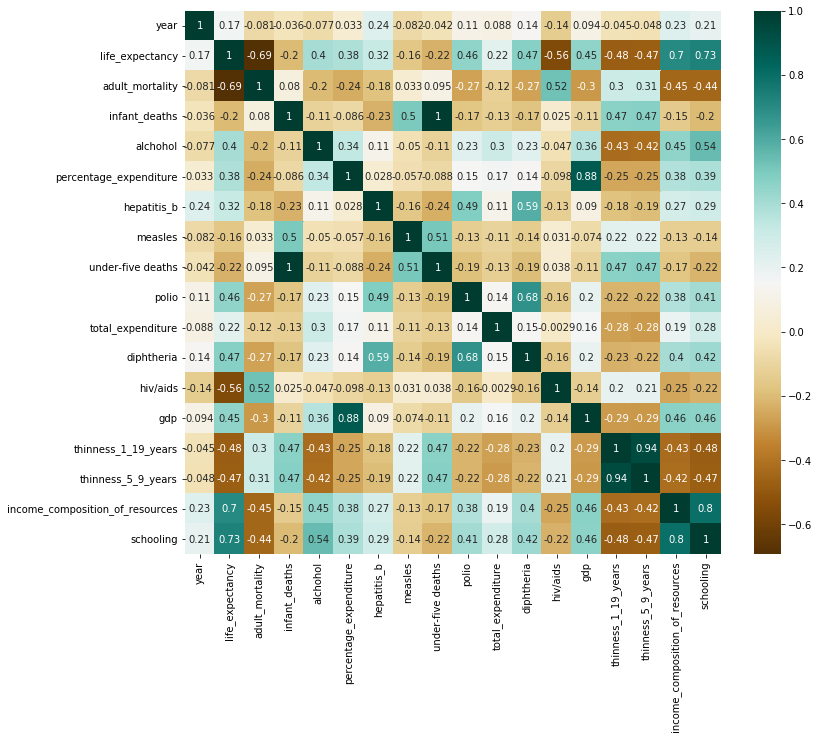

In [41]:
corr_matrix=data.corr()

plt.figure(1, figsize=(12,10))
sns.heatmap(corr_matrix, cmap='BrBG', annot=True)

corr_matrix = corr_matrix.drop('life_expectancy')
corr_matrix['life_expectancy'].abs().sort_values(ascending=False)

**Scatterplots**

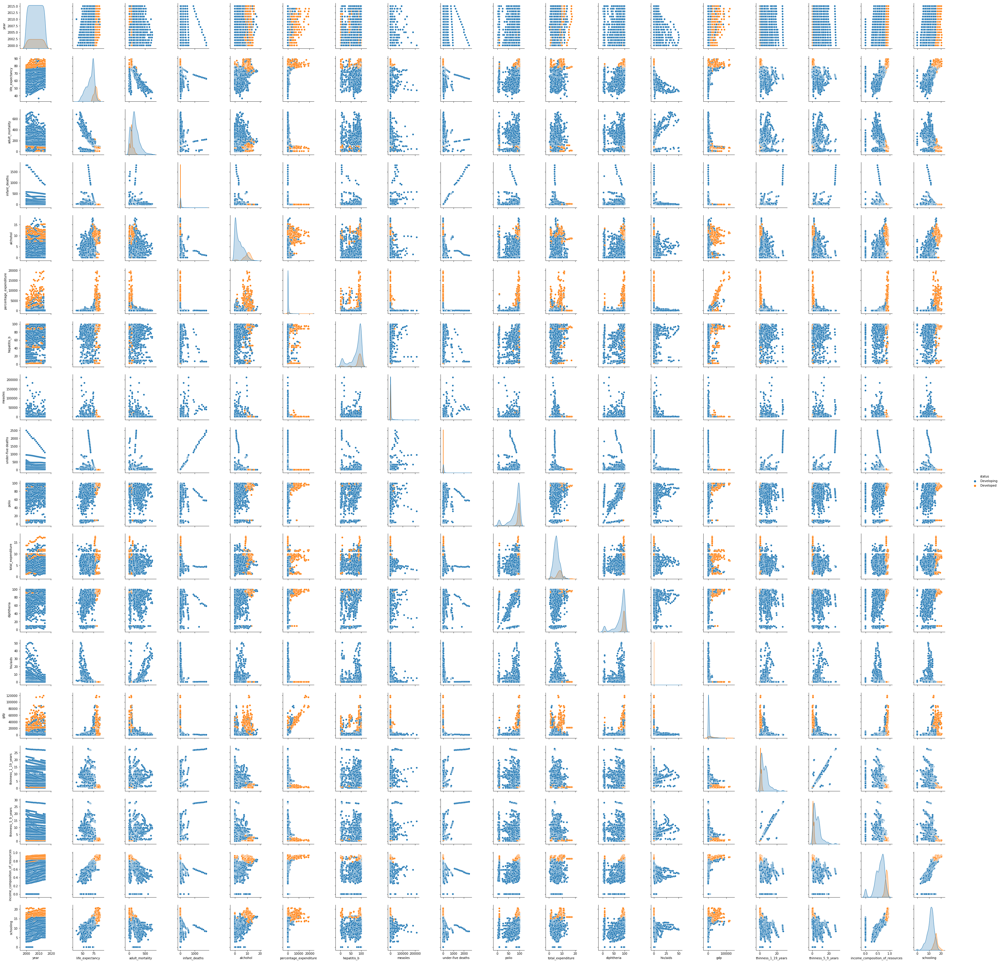

In [42]:
pair_plot = sns.pairplot(data, hue = 'status')

**Histogram**

In [43]:
data_numeric = data.select_dtypes(include='number')

column_numeric = data_numeric.columns.drop('year')

#print(column_numeric)

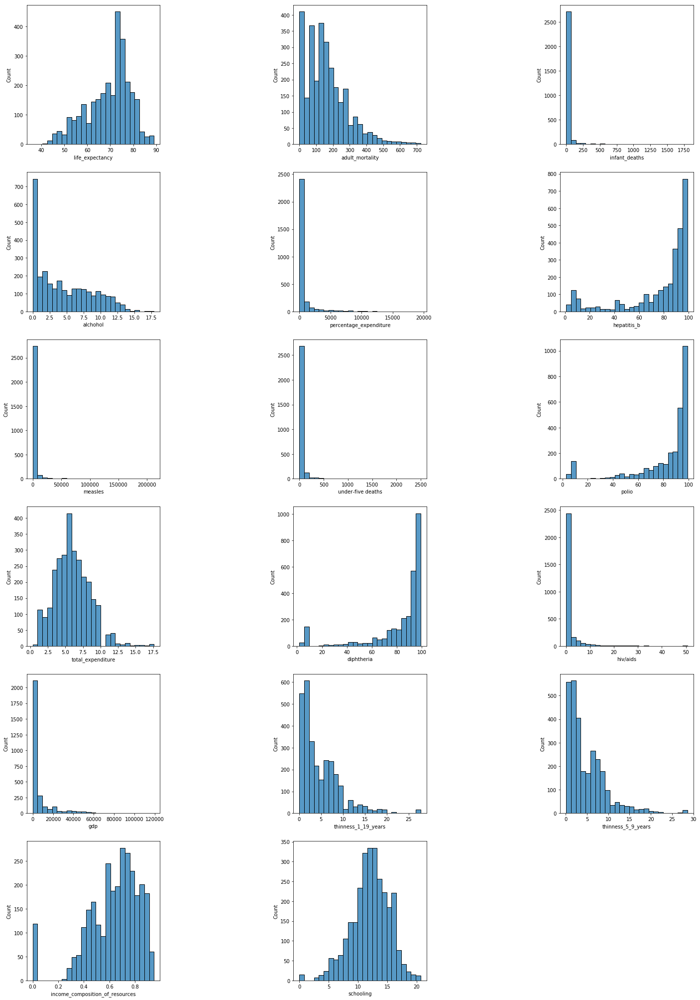

In [44]:
plt.figure(figsize=(24,36))
plt.subplots_adjust(wspace=1, hspace=None)

i = 1
for col_name in column_numeric:
    plt.subplot(6,3,i)
    sns.histplot(data = data[col_name],  bins = 25)
    i +=1

To note: The dataset is very skewed, has many outliers

**Box Plots**

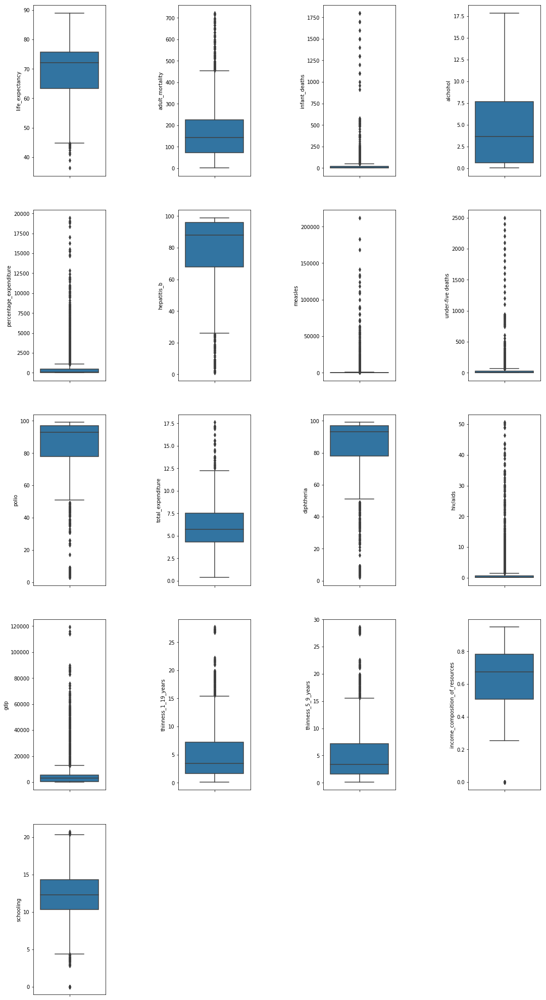

In [45]:
plt.figure(figsize=(18,36))
plt.subplots_adjust(wspace=1, hspace=None)


i = 1
for col_name in column_numeric:
    plt.subplot(5,4,i)
    sns.boxplot(data=data, y=col_name)
    i +=1

To Note: Large number of outliers

# Encoding

Encoding needs to be done only on data of one column 'status' and Label Encoding is more appropriate as the feature is ordinal

In [46]:
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()

data['class'] = labelencoder.fit_transform(data['status'])

# Outliers and Skewness

In [47]:
data.skew(axis = 0, numeric_only=True)

year                               0.00
life_expectancy                   -0.65
adult_mortality                    1.20
infant_deaths                      9.74
alchohol                           0.60
percentage_expenditure             4.63
hepatitis_b                       -1.52
measles                            9.40
under-five deaths                  9.45
polio                             -2.08
total_expenditure                  0.59
diphtheria                        -2.06
hiv/aids                           5.38
gdp                                3.34
thinness_1_19_years                1.71
thinness_5_9_years                 1.78
income_composition_of_resources   -1.14
schooling                         -0.47
class                             -1.70
dtype: float64

It seems Box-Transformation is the best way to deal with skewness(outliers too)<br>
However it requires the data to be greater than 0

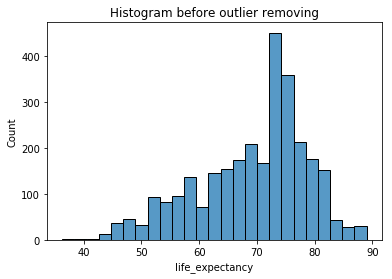

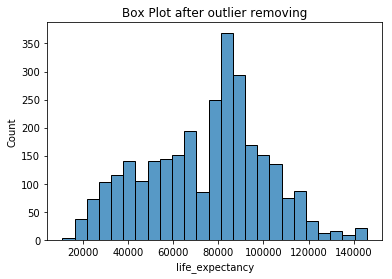

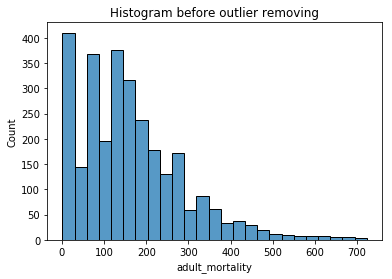

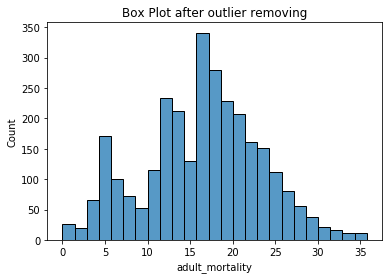

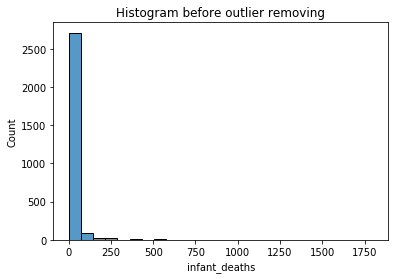

...

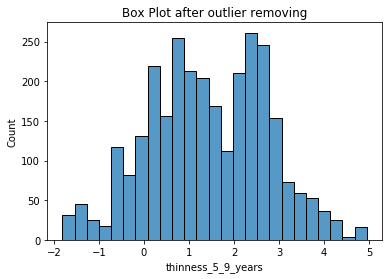

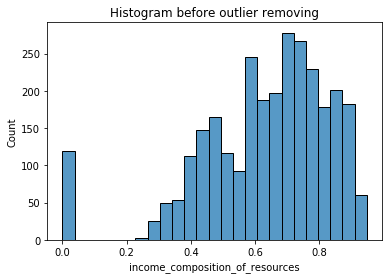

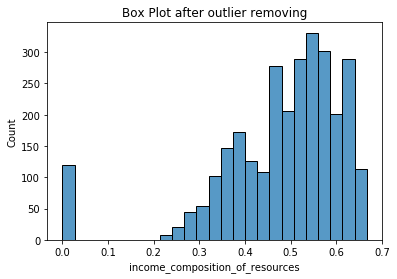

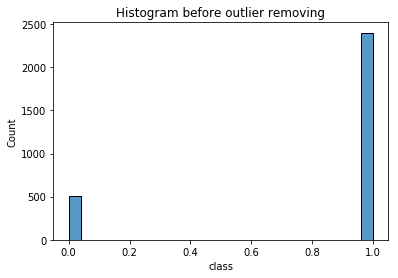

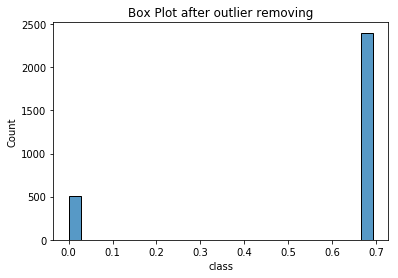

In [48]:
import scipy

for column in data.columns.drop(['country','status','year','schooling']):
    #print(column)
    sns.histplot(data = data[column],  bins = 25)
    plt.title("Histogram before outlier removing")
    plt.show()
    if ((data[column].min()>0)):
        data[column],fitted_lambda= scipy.stats.boxcox(data[column] ,lmbda=None)
    else:# using log(1+x) transformation
        data[column] = data[column] + 1
        data[column] = np.log(data[column])
    sns.histplot(data = data[column],  bins = 25)
    plt.title("Box Plot after outlier removing")
    plt.show()

In [49]:
data.skew(axis = 0, numeric_only=True)

year                               0.00
life_expectancy                   -0.10
adult_mortality                   -0.08
infant_deaths                      0.71
alchohol                          -0.39
percentage_expenditure            -0.09
hepatitis_b                       -0.98
measles                            0.55
under-five deaths                  0.66
polio                             -1.05
total_expenditure                  0.01
diphtheria                        -1.07
hiv/aids                           0.69
gdp                               -0.01
thinness_1_19_years               -0.03
thinness_5_9_years                -0.04
income_composition_of_resources   -1.66
schooling                         -0.47
class                             -1.70
dtype: float64

Wonderful

In [50]:
data.shape

(2912, 21)

# Data Split and Feature Selection

Our aim was to predict the life expectancy with given data

Bring life_expectancy to the last column

In [51]:
y = data['life_expectancy']
data.drop('life_expectancy', axis=1, inplace=True)
data = data.join(y)

Dropping object datatype columns(already encoded or deemed useless

In [52]:
for column in data:
    if ((data[column].dtype == 'object')):
        print(column)
        data.drop(column, axis=1, inplace=True)

country
status


In [53]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size=0.33, shuffle = True, random_state = 96)

In [54]:
X_train = train.iloc[:,0:-1].to_numpy()
y_train = train.iloc[:,-1].to_numpy()

X_test = test.iloc[:,0:-1].to_numpy()
y_test = test.iloc[:,-1].to_numpy()

In [55]:
print("Dimension of Train set as of now is ",X_train.shape)

Dimension of Train set as of now is  (1951, 18)


In [56]:
#X = data.iloc[:,0:-1].to_numpy()
#y = data.iloc[:,-1].to_numpy()

In [57]:
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile

#mutual_info_regression(X_train,y_train)

#print(X_train.shape)

#best_feat = SelectKBest(mutual_info_regression, k=15)

#X = SelectKBest(mutual_info_regression, k=12).fit_transform(X,y)

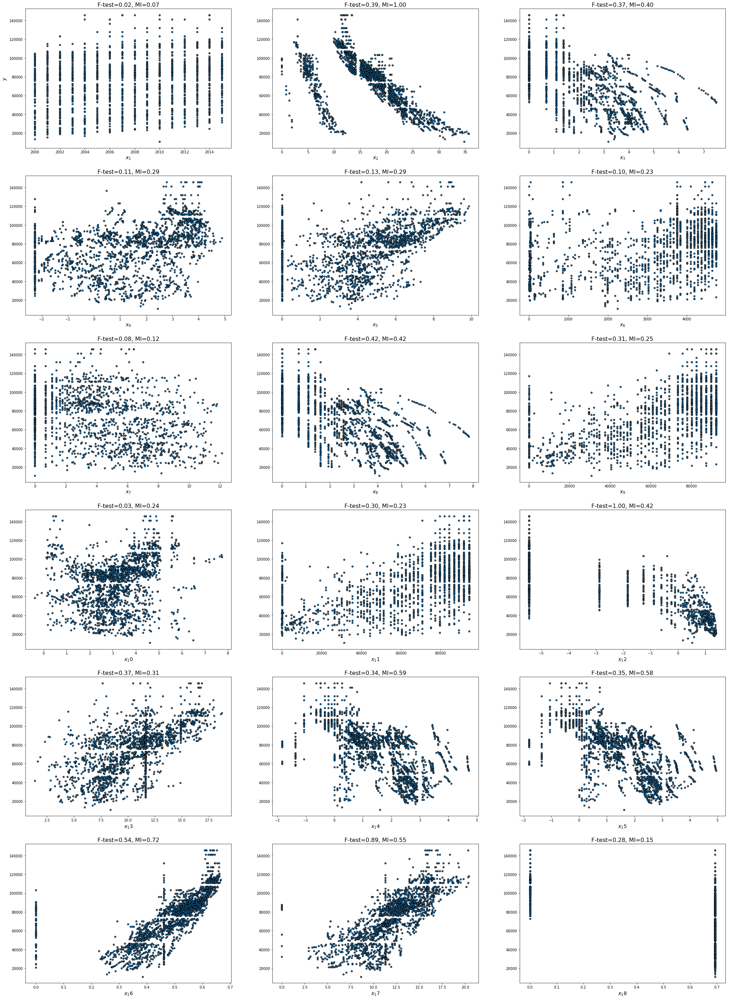

In [58]:
f_test, _ = f_regression(X_train, y_train)
f_test /= np.max(f_test)

mi = mutual_info_regression(X_train, y_train)
mi /= np.max(mi)


plt.figure(figsize=(35,50))
for i in range(18):
    plt.subplot(6, 3, i + 1)
    plt.scatter(X_train[:, i], y_train, edgecolor="black", s=20)
    plt.xlabel("$x_{}$".format(i + 1), fontsize=14)
    if i == 0:
        plt.ylabel("$y$", fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

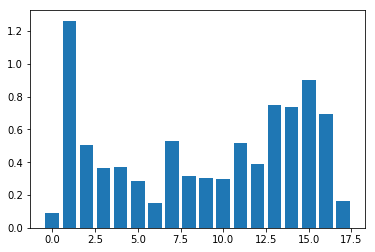

In [59]:
def select_features_mi(X_train, y_train, X_test):
    features = SelectKBest(score_func = mutual_info_regression, k= 16)
    features.fit(X_train, y_train)
    X_train_fs = features.transform(X_train)
    X_test_fs = features.transform(X_test)
    return X_train_fs, X_test_fs, features

X_train_fs, X_test_fs, feature_list_mi = select_features_mi(X_train, y_train, X_test)

for i in range(len(feature_list_mi.scores_)):
    pass
    #print('Feature %d: %f' % (i, feature_list_mi.scores_[i]))
plt.bar([i for i in range(len(feature_list_mi.scores_))], feature_list_mi.scores_)
plt.show()

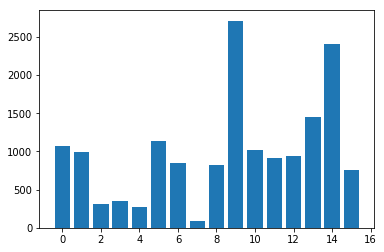

In [60]:
def select_features_f(X_train, y_train, X_test):
    features = SelectKBest(score_func = f_regression, k= 15)
    features.fit(X_train, y_train)
    X_train_fs = features.transform(X_train)
    X_test_fs = features.transform(X_test)
    return X_train_fs, X_test_fs, features

X_train_fs, X_test_fs, feature_list_f = select_features_f(X_train_fs, y_train, X_test_fs)

for i in range(len(feature_list_f.scores_)):
    pass
    #print('Feature %d: %f' % (i, feature_list_f.scores_[i]))
plt.bar([i for i in range(len(feature_list_f.scores_))], feature_list_f.scores_)
plt.show()

In [61]:
#from sklearn.utils import shuffle

#train = shuffle(train)
#test = shuffle(test)

In [62]:
print("Dimension of Train set prior to feature selection ",X_train.shape)

Dimension of Train set prior to feature selection  (1951, 18)


In [63]:
X_train = X_train_fs
X_test = X_test_fs

In [64]:
print("Dimension of Train set after to feature selection ",X_train.shape)

Dimension of Train set after to feature selection  (1951, 15)


# Modelling

In [65]:
from sklearn import preprocessing

X_train = preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)

In [66]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score

In [67]:
from sklearn.model_selection import GridSearchCV

from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV

In [68]:
#from sklearn.pipeline import make_pipeline

**Linear Regression**

In [69]:
#anova_lr = make_pipeline(best_feat, lr)
#anova_lr.fit(X_train, y_train)
#y_train_pred = anova_lr.predict(X_train)
#y_test_pred = anova_lr.predict(X_test)

#print("The training R^2 score for anova linear model ",r2_score(y_train, y_train_pred))
#print("The test R^2 score for anova linear model ",r2_score(y_test, y_test_pred))
#print()
#print("The training RMSE score for anova linear model ",math.sqrt(mean_squared_error(y_train_pred,y_train)))
#print("The test RMSE score for anova linear model ",math.sqrt(mean_squared_error(y_test_pred,y_test)))
#print()

In [70]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [71]:
linear_reg_model = lr.fit(X_train,y_train)

y_train_pred = linear_reg_model.predict(X_train)
y_test_pred = linear_reg_model.predict(X_test)

print("The training R^2 score for linear model ",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for linear model ",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for linear model  0.8127486631898967

The training RMSE score for linear model  11276.08288667068


No hyperparameters here

**Ridge**

In [72]:
from sklearn.linear_model import Ridge

ridge = Ridge()

param_grid = {
            "alpha": [1e0, 0.1, 1e-2, 1e-3],
            'tol': [1]
             }
grid = HalvingGridSearchCV(ridge, param_grid, refit = True, verbose = -1, n_jobs=-1, return_train_score = True)

ridge_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 

#print(grid.refit_time_)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 650
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 4
n_resources: 650
----------
iter: 1
n_candidates: 2
n_resources: 1950
{'alpha': 0.01, 'tol': 1}


In [73]:
y_train_pred = ridge_best_model.predict(X_train)
y_test_pred = ridge_best_model.predict(X_test)

print("The training R^2 score for best Ridge Regression model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Ridge Regression model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best Ridge Regression model is 0.8127486529228587

The training RMSE score for best Ridge Regression model is 11276.083195805908


**Lasso**

In [74]:
from sklearn.linear_model import Lasso

lasso = Lasso()

param_grid = {
            "alpha": [1e0, 0.1, 1e-2, 1e-3],
            'tol': [1]
             }
grid = HalvingGridSearchCV(lasso, param_grid, refit = True, verbose = -1, n_jobs=-1, return_train_score = True)

lasso_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 

#print(grid.refit_time_)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 650
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 4
n_resources: 650
----------
iter: 1
n_candidates: 2
n_resources: 1950
{'alpha': 1.0, 'tol': 1}


In [75]:
y_train_pred = lasso_best_model.predict(X_train)
y_test_pred = lasso_best_model.predict(X_test)

print("The training R^2 score for best Lasso Regression model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Lasso Regression model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best Lasso Regression model is 0.7437838641702899

The training RMSE score for best Lasso Regression model is 13190.128746491087


**Polynomial Regression**

In [76]:
from sklearn.preprocessing import PolynomialFeatures

for alpha in range(1,4):
    
    polynomial_regressor = PolynomialFeatures(degree = alpha)
    
    X_poly_train = polynomial_regressor.fit_transform(X_train)
    X_poly_test = polynomial_regressor.fit_transform(X_test)
    
    poly_reg_model = LinearRegression().fit(X_poly_train,y_train)
    
    y_train_pred = poly_reg_model.predict(X_poly_train)
    y_test_pred = poly_reg_model.predict(X_poly_test)

    train_score = math.sqrt(mean_squared_error(y_train_pred,y_train))
    test_score = math.sqrt(mean_squared_error(y_test_pred,y_test))

    print("The training R^2 score for polynomial model with degree ",alpha, "is",r2_score(y_train, y_train_pred))
    print("The test R^2 score for polynomial model with degree ",alpha, "is",r2_score(y_test, y_test_pred))
    print()
    print("The training RMSE score for polynomial model with degree ",alpha, "is",math.sqrt(mean_squared_error(y_train_pred,y_train)))
    print("The test RMSE score for polynomial model with degree ",alpha, "is",math.sqrt(mean_squared_error(y_test_pred,y_test)))
    print()
    if (alpha == 1):
        print("Basically Linear Regression")
        print()

The training R^2 score for polynomial model with degree  1 is 0.8127486631898967
The test R^2 score for polynomial model with degree  1 is 0.8178884224806593

The training RMSE score for polynomial model with degree  1 is 11276.08288667068
The test RMSE score for polynomial model with degree  1 is 11462.442371282037

Basically Linear Regression

The training R^2 score for polynomial model with degree  2 is 0.9175358196003558
The test R^2 score for polynomial model with degree  2 is -1.4558051321329804e+16

The training RMSE score for polynomial model with degree  2 is 7483.046941846659
The test RMSE score for polynomial model with degree  2 is 3240858055595.795

The training R^2 score for polynomial model with degree  3 is 0.9689524774316135
The test R^2 score for polynomial model with degree  3 is -5.19025879194866e+16

The training RMSE score for polynomial model with degree  3 is 4591.549512551396
The test RMSE score for polynomial model with degree  3 is 6119316179909.098



Well, it appears that polynomial of degree 1 works fine<br>
However, higher degree give trash result

In [77]:
polynomial_regressor = PolynomialFeatures(degree = 1)
    
X_poly_train = polynomial_regressor.fit_transform(X_train)
X_poly_test = polynomial_regressor.fit_transform(X_test)

poly_reg_model = LinearRegression().fit(X_poly_train,y_train)

**K Nearest Neighbours**

In [78]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor()

param_grid = {
            'n_neighbors':[1,2,3,4,5,6,7,8,9],
            'weights':['uniform', 'distance'],
            'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
            'p':[1,2],
             }
grid = HalvingGridSearchCV(knn, param_grid, refit = True, verbose = -1, n_jobs=-1, return_train_score = True)

knn_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 

#print(grid.refit_time_)

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 24
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 144
n_resources: 24
----------
iter: 1
n_candidates: 48
n_resources: 72
----------
iter: 2
n_candidates: 16
n_resources: 216
----------
iter: 3
n_candidates: 6
n_resources: 648
----------
iter: 4
n_candidates: 2
n_resources: 1944
{'algorithm': 'kd_tree', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}


In [79]:
y_train_pred = knn_best_model.predict(X_train)
y_test_pred = knn_best_model.predict(X_test)

print("The training R^2 score for best KNN model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best KNN model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best KNN model is 1.0

The training RMSE score for best KNN model is 0.0


**Kernel Ridge Regression**

In [80]:
from sklearn.kernel_ridge import KernelRidge

krr = KernelRidge()

param_grid = {
            "alpha": [1e0, 0.1, 1e-2, 1e-3], 
            "gamma": np.logspace(-2, 2, 5),
            "degree": [3, 5, 7, 9]
             }
grid = HalvingGridSearchCV(krr, param_grid, refit = True, verbose = -1, n_jobs=-1, return_train_score = True)

krr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 

#print(grid.refit_time_)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 72
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 80
n_resources: 72
----------
iter: 1
n_candidates: 27
n_resources: 216
----------
iter: 2
n_candidates: 9
n_resources: 648
----------
iter: 3
n_candidates: 3
n_resources: 1944
{'alpha': 1.0, 'degree': 5, 'gamma': 1.0}


In [81]:
y_train_pred = krr_best_model.predict(X_train)
y_test_pred = krr_best_model.predict(X_test)

print("The training R^2 score for best Kernel Ridge model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Kernel Ridge model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best Kernel Ridge model is -7.281589101210582

The training RMSE score for best Kernel Ridge model is 74989.87600829762


# # # Note: Model perform badly when shuffle is off

**SVM**

In [82]:
from sklearn.svm import SVR

svr = SVR()

param_grid = {
              'kernel': ['linear','poly', 'rbf', 'sigmoid'],
              'C': [10000,50000,100000,500000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'gamma':['scale', 'auto'],
              }
grid = HalvingGridSearchCV(svr, param_grid, refit = True, verbose = -1,n_jobs=-1)

svr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 

#print(grid.refit_time_)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 72
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 32
n_resources: 72
----------
iter: 1
n_candidates: 11
n_resources: 216
----------
iter: 2
n_candidates: 4
n_resources: 648
----------
iter: 3
n_candidates: 2
n_resources: 1944
{'C': 100000, 'gamma': 'scale', 'kernel': 'rbf'}


In [83]:
y_train_pred = svr_best_model.predict(X_train)
y_test_pred = svr_best_model.predict(X_test)

print("The training R^2 score for best SVM model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best SVM model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best SVM model is 0.9526227052412574

The training RMSE score for best SVM model is 5671.93082551996


**Decision Tree Regressor**

In [84]:
from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()

param_grid = {
            'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
            'max_depth' : [3,7,11,15,19],
            'min_weight_fraction_leaf':[0.0005,0.001,0.005],
            'max_features':['auto','log2','sqrt',None],
             }
grid = HalvingGridSearchCV(dtr, param_grid, refit = True, verbose = -1,n_jobs=-1, error_score = 'raise')

dtr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 

#print(grid.refit_time_)

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 24
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 240
n_resources: 24
----------
iter: 1
n_candidates: 80
n_resources: 72
----------
iter: 2
n_candidates: 27
n_resources: 216
----------
iter: 3
n_candidates: 9
n_resources: 648
----------
iter: 4
n_candidates: 3
n_resources: 1944
{'criterion': 'friedman_mse', 'max_depth': 11, 'max_features': None, 'min_weight_fraction_leaf': 0.005}


In [85]:
y_train_pred = dtr_best_model.predict(X_train)
y_test_pred = dtr_best_model.predict(X_test)

print("The training R^2 score for best Decision Tree model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Decision Tree model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best Decision Tree model is 0.9562130538629869

The training RMSE score for best Decision Tree model is 5452.781868027973


**Random Forest Regressor**

In [86]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor()

param_grid = param_grid = {
        'criterion': ['squared_error', 'absolute_error', 'poisson'],
        'max_depth': [100, 110],
        'max_features': [4, 5],
        'min_samples_leaf': [2, 4],
        'min_samples_split': [6],
        'n_estimators': [500,1000]
}
grid = HalvingGridSearchCV(rfr, param_grid, refit = True, verbose = -1,n_jobs=-1)

rfr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)

#print(grid.refit_time_)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 72
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 48
n_resources: 72
----------
iter: 1
n_candidates: 16
n_resources: 216
----------
iter: 2
n_candidates: 6
n_resources: 648
----------
iter: 3
n_candidates: 2
n_resources: 1944
{'criterion': 'squared_error', 'max_depth': 110, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 1000}


In [87]:
y_train_pred = rfr_best_model.predict(X_train)
y_test_pred = rfr_best_model.predict(X_test)

print("The training R^2 score for best Random Forest model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Random Forest model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))

The training R^2 score for best Random Forest model is 0.9840684577904045

The training RMSE score for best Random Forest model is 3289.0820333030897


**Gradient Boost Regressor**

In [88]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor()

param_grid = {
                'learning_rate': [0.008,0.01,0.03],
                'subsample'    : [0.8, 0.5, 0.3],
                'n_estimators' : [500,1000],
                'max_depth'    : [6,8,12,14]
             }
grid = HalvingGridSearchCV(gbr, param_grid, refit = True, verbose = -1,n_jobs=-1)

gbr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)

#print(grid.refit_time_)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 72
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 72
n_resources: 72
----------
iter: 1
n_candidates: 24
n_resources: 216
----------
iter: 2
n_candidates: 8
n_resources: 648
----------
iter: 3
n_candidates: 3
n_resources: 1944
{'learning_rate': 0.008, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.5}


In [89]:
y_train_pred = gbr_best_model.predict(X_train)
y_test_pred = gbr_best_model.predict(X_test)

print("The training R^2 score for best Gradient Boost model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Gradient Boost model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))
print()

The training R^2 score for best Gradient Boost model is 0.9977693335649448

The training RMSE score for best Gradient Boost model is 1230.730922076766



**Bagging Regressor**

In [90]:
from sklearn.ensemble import BaggingRegressor

br = BaggingRegressor()

param_grid = {
             #'base_estimator__max_depth' : [1, 2, 3, 4, 5],
             'max_samples' : [0.05, 0.1, 0.2, 0.5]
             }
grid = HalvingGridSearchCV(br, param_grid, refit = True, verbose = -1,n_jobs=-1)

br_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)

#print(grid.refit_time_)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 650
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 4
n_resources: 650
----------
iter: 1
n_candidates: 2
n_resources: 1950
{'max_samples': 0.5}


In [91]:
y_train_pred = br_best_model.predict(X_train)
y_test_pred = br_best_model.predict(X_test)

print("The training R^2 score for best Bagging Regressor model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Bagging Regressor model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))
print()

The training R^2 score for best Bagging Regressor model is 0.9733623942785921

The training RMSE score for best Bagging Regressor model is 4252.98047899637



**Multi Layer Perceptron (Neural Networks)**

In [92]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor()

param_grid = {
                "alpha": [1 ,10, 100],
                'learning_rate_init': [0.01,0.05],
                'max_iter': [2000],
                'tol': [0.5],
             }
grid = HalvingGridSearchCV(mlp, param_grid, refit = True, verbose = -1,n_jobs=-1)

mlp_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)

#print(grid.refit_time_)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 650
max_resources_: 1951
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 6
n_resources: 650
----------
iter: 1
n_candidates: 2
n_resources: 1950
{'alpha': 100, 'learning_rate_init': 0.05, 'max_iter': 2000, 'tol': 0.5}


In [93]:
y_train_pred = mlp_best_model.predict(X_train)
y_test_pred = mlp_best_model.predict(X_test)

print("The training R^2 score for best Neural Network model is",r2_score(y_train, y_train_pred))
print()
print("The training RMSE score for best Neural Network model is",math.sqrt(mean_squared_error(y_train_pred,y_train)))
print()

The training R^2 score for best Neural Network model is 0.8816897604210348

The training RMSE score for best Neural Network model is 8963.073608311875



In [94]:
models = []

models.append(('Linear Regression', linear_reg_model))
models.append(('Ridge(Linear) Regression', ridge_best_model))
models.append(('Lasso(Linear) Regression', lasso_best_model))
models.append(('Polynomial Regression', poly_reg_model))
models.append(('K Nearest Neighbour', knn_best_model))
#models.append(('Kernel Ridge Regression', krr_best_model))
models.append(('Support Vector', svr_best_model))
models.append(('Decision Tree', dtr_best_model))
models.append(('Random Forest', rfr_best_model))
models.append(("Gradient Boost", gbr_best_model))
models.append(("Bagging Regressor", br_best_model))
models.append(("Neural Network", mlp_best_model))


model_name = []
RMSE = []
R2 = []

Y_TEST_PRED = []

    
for name, model in models:
    if (name == 'Polynomial Regression'):
        model_name.append(name)
        y_test_pred = model.predict(X_poly_test)
        rmse = math.sqrt(mean_squared_error(y_test_pred,y_test))
        r2 = r2_score(y_test, y_test_pred)

        RMSE.append(rmse)
        R2.append(r2)
        Y_TEST_PRED.append(y_test_pred)
    else:
        model_name.append(name)
        y_test_pred = model.predict(X_test)
        rmse = math.sqrt(mean_squared_error(y_test_pred,y_test))
        r2 = r2_score(y_test, y_test_pred)
        
        RMSE.append(rmse)
        R2.append(r2)
        Y_TEST_PRED.append(y_test_pred)
        
model_score = pd.DataFrame(zip(model_name, RMSE, R2) , columns=['Name', 'RMSE','R2'])

model_score = model_score.sort_values(by='RMSE', ascending=False)

#print(model_score.sort_values(by=['RMSE']))
model_score

,Name,RMSE,R2
2,Lasso(Linear) Regression,13655.21,0.74
0,Linear Regression,11462.44,0.82
3,Polynomial Regression,11462.44,0.82
1,Ridge(Linear) Regression,11462.33,0.82
10,Neural Network,9824.74,0.87
6,Decision Tree,8064.58,0.91
5,Support Vector,7151.26,0.93
4,K Nearest Neighbour,7048.06,0.93
9,Bagging Regressor,7002.07,0.93
7,Random Forest,6135.28,0.95


<BarContainer object of 11 artists>

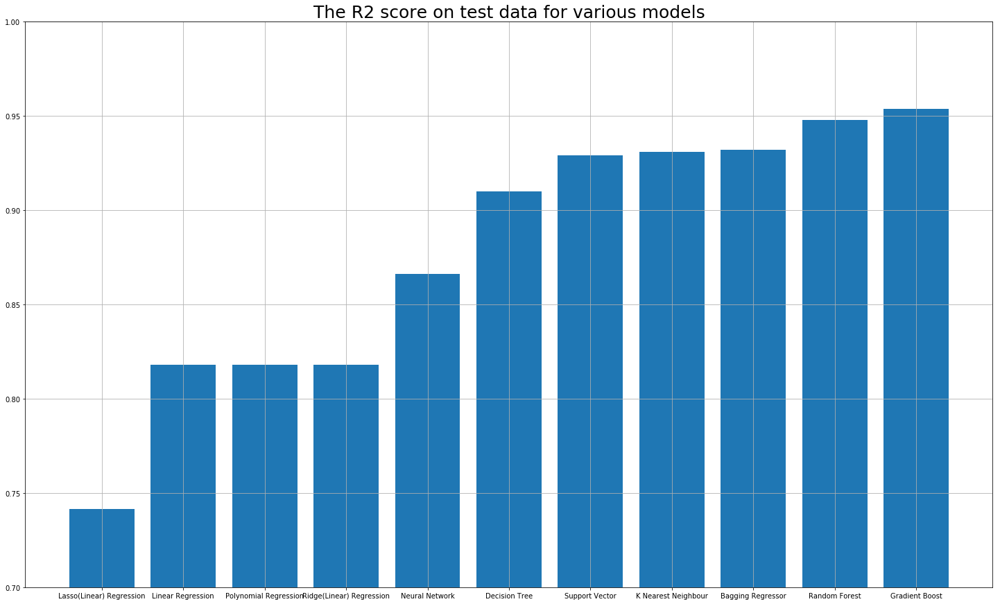

In [95]:
name = model_score['Name']
rmse = model_score['RMSE']
r2 = model_score['R2']

fig = plt.figure(figsize =(25, 15))

plt.ylim(0.7, 1.0)
plt.grid()
plt.title("The R2 score on test data for various models", {'fontsize': 25})

plt.bar(name, r2)

**It appears that Gradient Boosting Regressor gives the best result**